# Viewing the content of a 3D fits data cube 

Tutorial on investigating the contents of a 3D fits data cube.

This tutorial is viewig the conents of the example data cube provided by the GaussPy+ python package. https://github.com/mriener/gausspyplus

The data is showing $^{13}CO$ emission in the Galaxy.

In [37]:
# viewing the content of the fits data cube

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS


# for the animation
import glob
from PIL import Image
import os
from IPython import display

In [2]:
# opening the data file

data_dir = '/Users/denes/App_installers/gausspyplus-master/data/'
file = 'cube_13co_S_cut.fits'
hdul = fits.open(data_dir+file)

# Fits files have a header part, which contains the metadata of the file, in this case the details of the observation
h = hdul[0].header

# and a data part, which is esentially an N dimensional matrix with numbers
d = hdul[0].data

In [48]:
# viewing the metadata
print(h)

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    3 / number of array dimensions                     NAXIS1  =                   82                                                  NAXIS2  =                   82                                                  NAXIS3  =                  132                                                  DATAMIN = -0.1000000366211E+04         /                                        DATAMAX =  0.1582348918915E+02         /                                        BUNIT   = 'K (Ta*)     '               /                                        OBJECT  = 'SGRB2M      '               /                                        RA      =  0.2668350000000E+03         / Right Ascension                        DEC     = -0.2838534722222E+02         / Declination                            LINE    = 'HNCO(5-4)   '               /

In [5]:
# check the shape of teh data

print(d.shape)

(132, 82, 82)


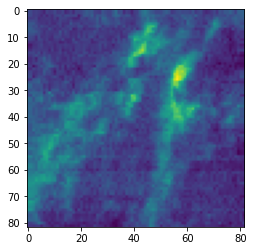

In [6]:
# print slices of the data

plt.imshow(d[70,:,:])

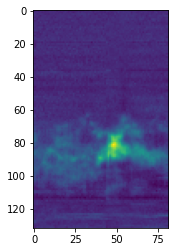

In [7]:
# print slices of the data
# note that most of the gas is at specific velocities

plt.imshow(d[:,40,:])

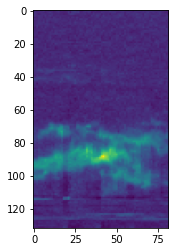

In [8]:
plt.imshow(d[:,:,40])

# Make moment maps

In [11]:
print(h['CDELT3'])

-2720.406293869


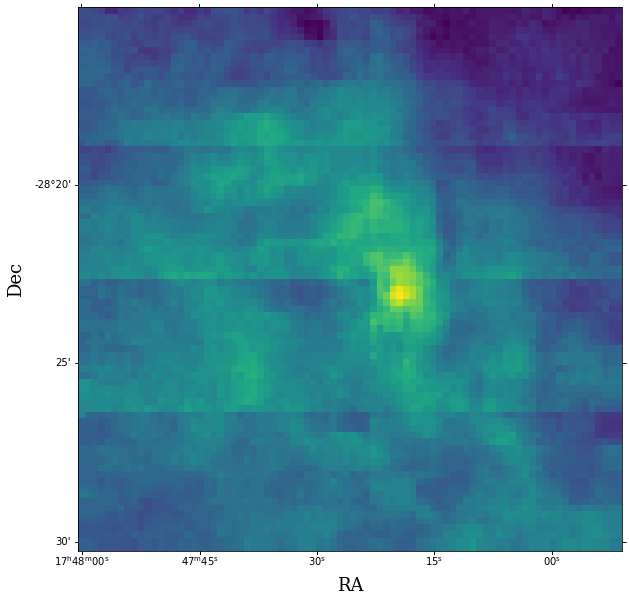

In [26]:
fig = plt.figure(figsize=(11,10))

# moment 0 - integrated intensity per pixel
d_2_av = np.sum(d, axis=0)* abs(h['CDELT3'])/1000

ax = fig.add_subplot(1,1,1, projection=WCS(h), slices=('x', 'y', 50))
plt.imshow(d_2_av)
ax.set_xlabel('RA', size=18,family='serif')
ax.set_ylabel('Dec', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.show()

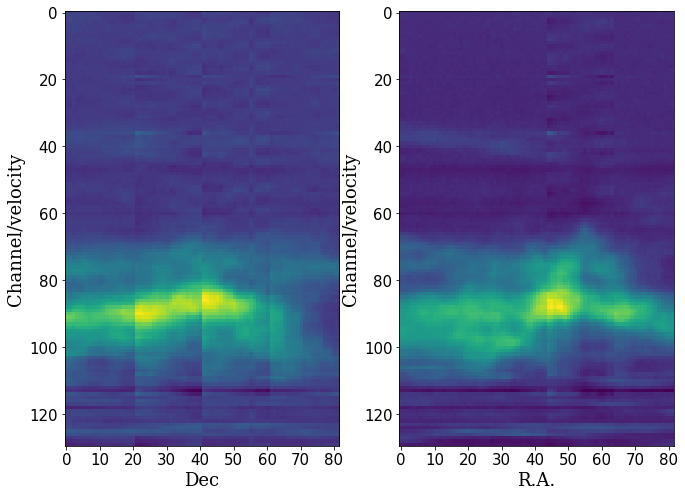

In [34]:
fig = plt.figure(figsize=(11,8))

d_2_av2 = np.mean(d, axis=2) # axis 2 is the RA
d_2_av3 = np.mean(d, axis=1) # axis 2 is the RA

ax = fig.add_subplot(1,2,1)
plt.imshow(d_2_av2[:-2,:])

ax.set_xlabel('Dec', size=18,family='serif')
ax.set_ylabel('Channel/velocity', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

ax = fig.add_subplot(1,2,2)
plt.imshow(d_2_av3[:-2,:])

ax.set_xlabel('R.A.', size=18,family='serif')
ax.set_ylabel('Channel/velocity', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.show()

## Checking the spectrum 

NAXIS3 = number of pixels in axis 3 (velocity) 

CRPIX3 = reference pixel (this is the middle of the cube here)

CDELT3 = width of a pixel

CUNIT3 = units

CTYPE3 = type of data (here it is velocity)


In [51]:
# check the description of the 3rd axis (velocity or frequency)
print(h['**3'])

NAXIS3  =                  132                                                  CRPIX3  =        87.8656005859 / Pixel coordinate of reference point            CDELT3  =      -2720.406293869 / [m/s] Coordinate increment at reference point  CUNIT3  = 'm/s'                / Units of coordinate increment and value        CTYPE3  = 'VRAD'               / Radio velocity (linear)                        CRVAL3  =              60000.0 / [m/s] Coordinate value at reference point      END                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

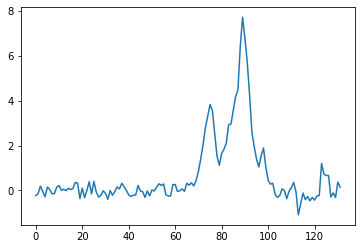

In [43]:
# checking the spectrum in a pixel

plt.plot(d[:,40,40])

(132, 82)
3rd axis type VRAD
3rd axis steps -2720.406293869
3rd axis reference 60000.0
data units K (Ta*)


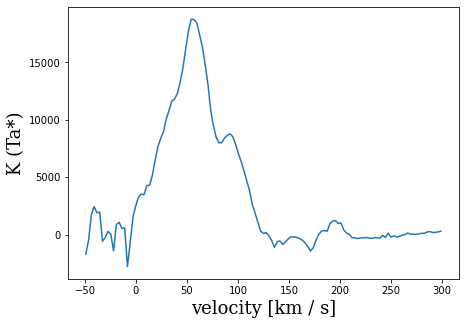

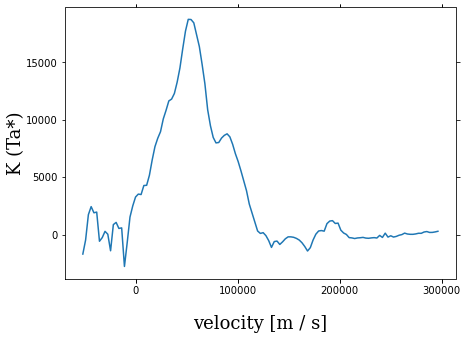

In [56]:
# average for the whole cube, but make sure to take the masked data that does not have the noise anymore
# Note the tipical "dubble horn" shape of the profile, this is showing the rotation of the galaxy

d_av = np.sum(d[:,:,:], axis = 1)
print(d_av.shape)
d_av_3 = np.sum(d_av[:,:], axis = 1)
spectra = d_av_3[:-3]

# checking the units of the spectral axis
print('3rd axis type', h['CTYPE3'])  # the third dimension of this cube is in heliocentric velocity
print('3rd axis steps', h['CDELT3']) # in m/s
print('3rd axis reference', h['CRVAL3']) # in m/s
print('data units', h['BUNIT'])

# calculate the value for the first coordinate
s_start = h['CRVAL3'] - h['CRPIX3']*h['CDELT3']

# calculate the velocity axis
x_axis = (np.arange(0,len(spectra))*h['CDELT3']+s_start) / 1000 # we also convert to km/s from m/s

# make figure

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(1,1,1)
plt.plot(x_axis, spectra)  # the last channel if the data cube is bad (with very high noise), so we don't include that in the plot
ax.set_xlabel('velocity [km / s]', size=18,family='serif')
ax.set_ylabel('K (Ta*)', size=18,family='serif')
plt.show()


fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(1,1,1, projection=WCS(h), slices=(50, 50, 'x'))
plt.plot(spectra)  # the last channel if the data cube is bad (with very high noise), so we don't include that in the plot
ax.set_xlabel('velocity [m / s]', size=18,family='serif')
ax.set_ylabel('K (Ta*)', size=18,family='serif')
ax.invert_xaxis()

plt.show()

## Making an animation of the cube

<ipython-input-35-74823de23b12>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(11,10))


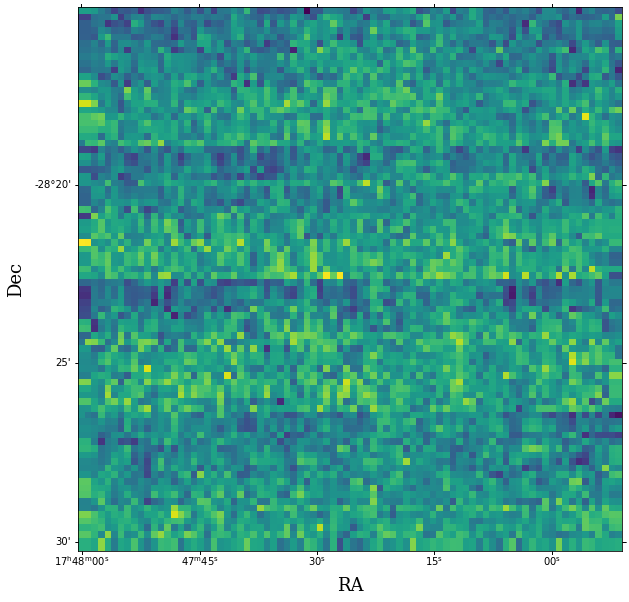

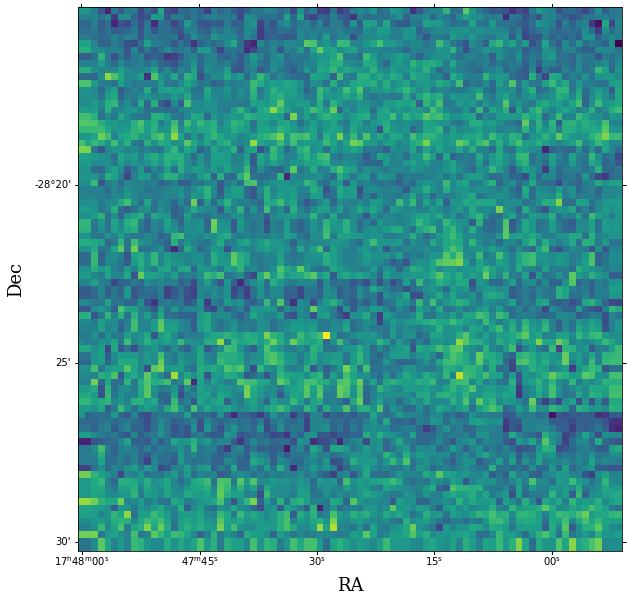

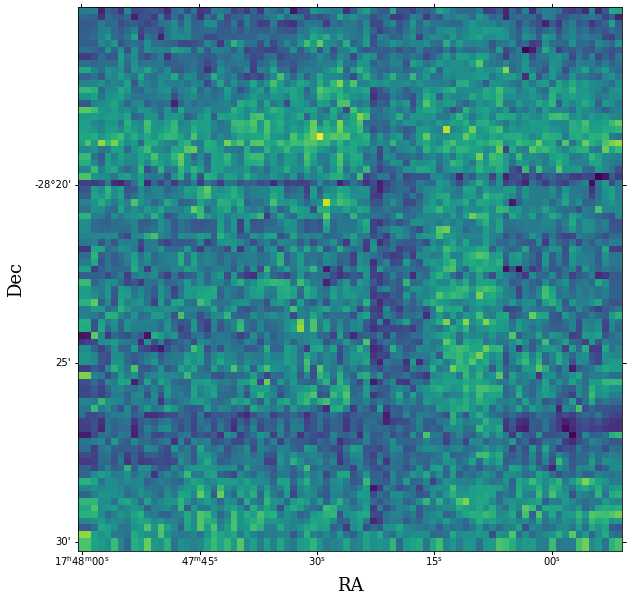

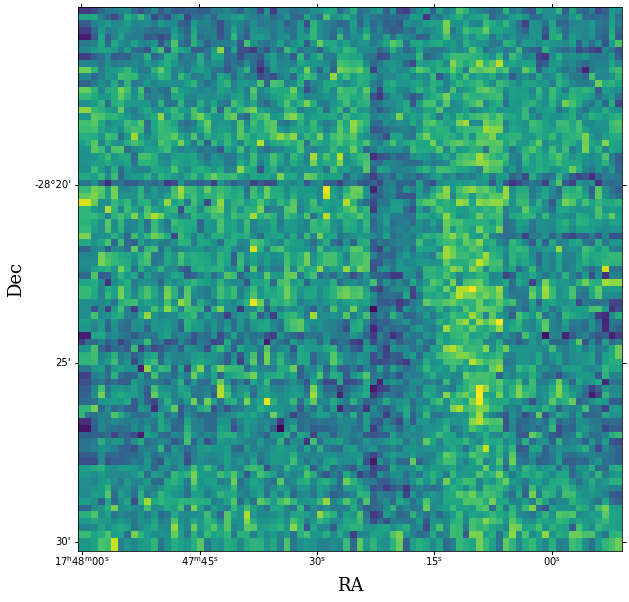

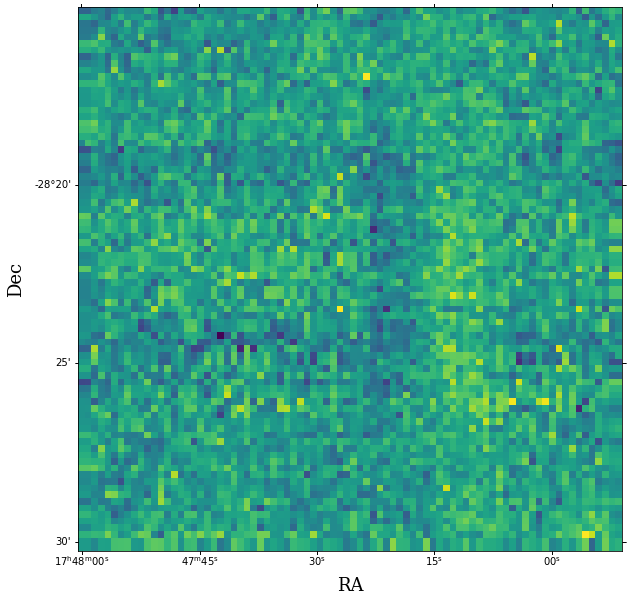

...

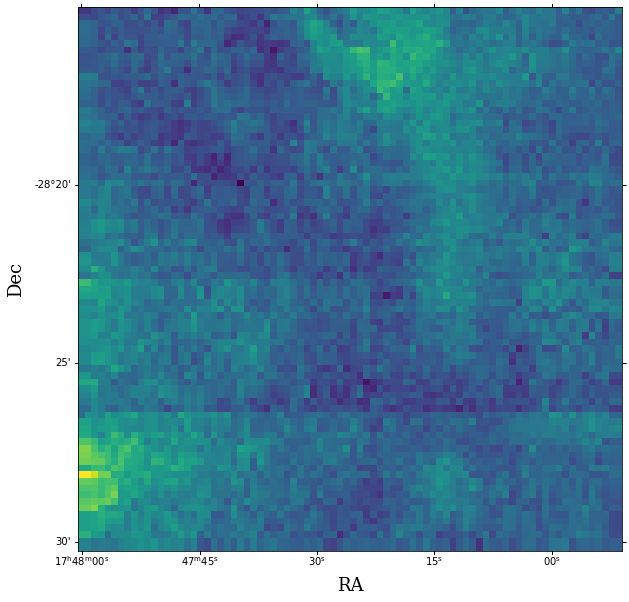

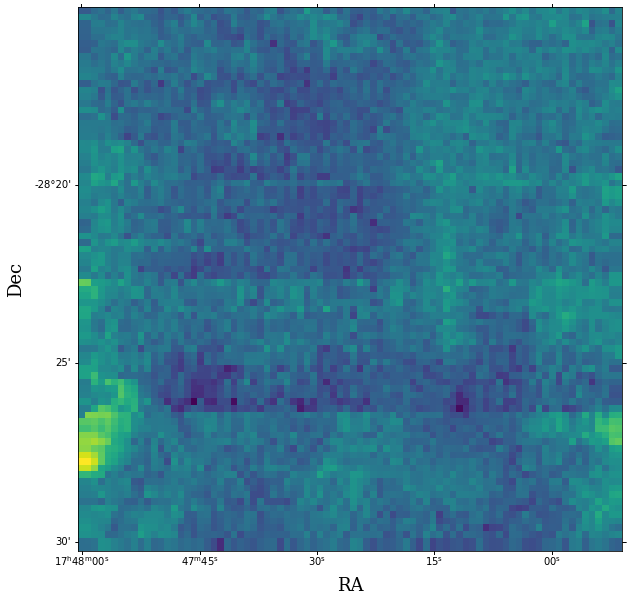

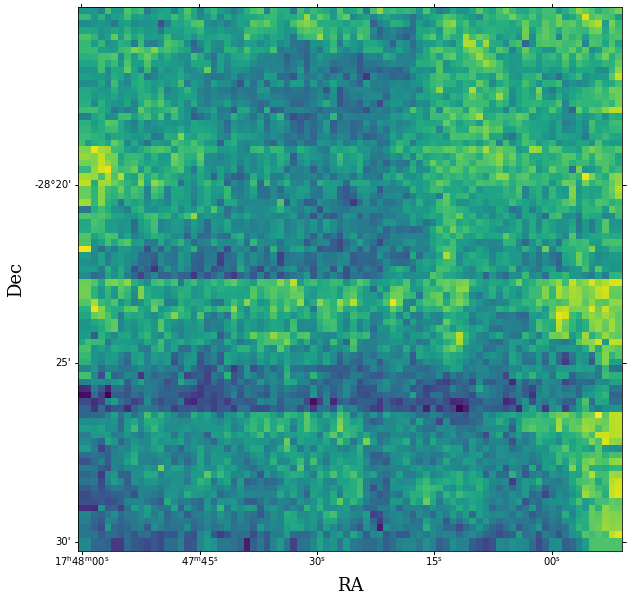

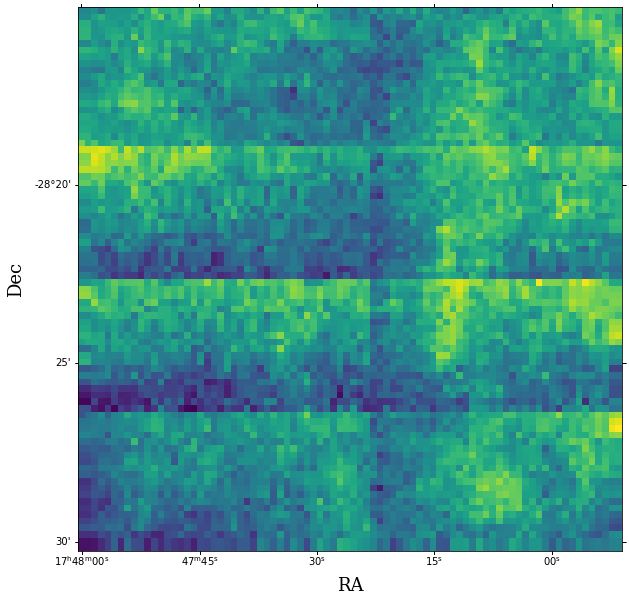

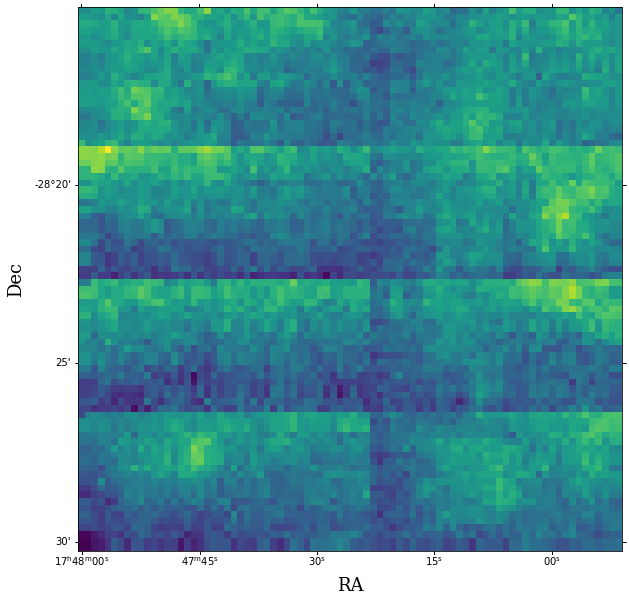

In [35]:
# make images of all of the velocity channels
# the images are saved in a directory called plots

for i in range(d.shape[0]):
#for i in range(0,3):
    fig = plt.figure(figsize=(11,10))
    ax = fig.add_subplot(projection=WCS(h), slices=('x', 'y', i))
    plt.imshow(d[i,:,:])
    ax.set_xlabel('RA', size=18,family='serif')
    ax.set_ylabel('Dec', size=18,family='serif')
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.savefig('plots/cube_13co_S_cut_{:02d}.png'.format(i)) # saving the figure using all 2 digit numbers

In [38]:
# input images
images_input = 'plots/cube_13co_S_cut_***.png'
# output gif
imgif_output = "cube_13co_S_cut_animation.gif"

# Collect the images
imgs = (Image.open(f) for f in sorted(glob.glob(images_input)))

img = next(imgs)

# save the gif file
img.save(fp = imgif_output, format = "GIF", append_images = imgs, save_all = True, duration = 120, loop = 0)

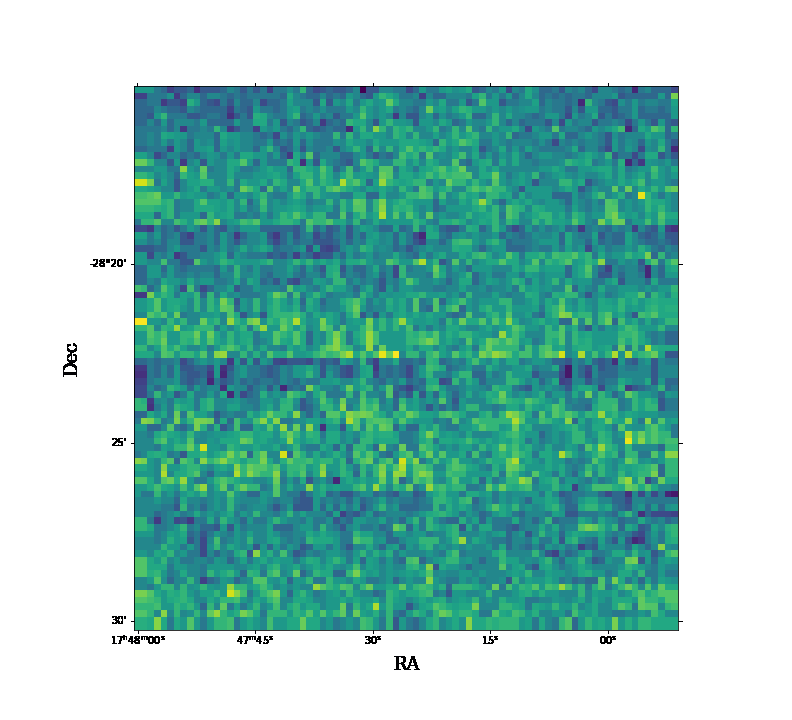

In [39]:
# Show the animation
display.Image("cube_13co_S_cut_animation.gif")